# SIGNAL PROCESSING TP4 - M2 AI
## To Do: denoising by spectral substraction

- Benedictus Kent Rachmat
- Jacobo Ruiz Ocampo

---

## IMPORT

In [1]:
import librosa
import numpy as np
import librosa.display
from scipy.signal import welch, stft, istft
import matplotlib.pyplot as plt
from collections import defaultdict
from IPython.display import display, Audio

In order to add a noise $n$ with a certain SNR to a signal $x$, we need to introduce a scaling factor parameter, here alpha:

$$
\text{SNR} = 10*\log_{10}(\frac{||x||_{2}^{2}}{\alpha^2||n||_{2}^{2}})
$$
And by solving the equation for $\alpha$, we find that :
$$
\alpha = \sqrt{\frac{||x||_{2}^{2}}{10^{\frac{\text{SNR}}{10}}||n||_{2}^{2}}}
$$
Therefore the noisy signal $y$ for a given level of SNR will be:
$$
y = x+\alpha *n
$$

In [2]:
def add_noise(signal, noise, snr_db):
    """
    Add noise to the signal with a given SNR value
    Args:
        signal: The clean signal.
        noise: The noise signal.
        snr_db: Desired SNR in dB.
    Returns:
        Noisy signal.
    """

    # Calculate the power of the signal and the noise
    spow = np.mean(signal**2)
    npow = np.mean(noise**2)
    
    # Calculate the scaling factor for noise
    scale_factor = np.sqrt(spow / (npow * 10 ** (snr_db / 10) ) )
    
    # Scale the noise and add it to the signal
    noisy_signal = signal + scale_factor * noise
    
    return noisy_signal

In [3]:
music_data, music_rate = librosa.load("music.wav")
SNR_VALUES = [0, 10, 20]
NOISES = ["noise1.wav", "noise2.wav", "noise3.wav"]

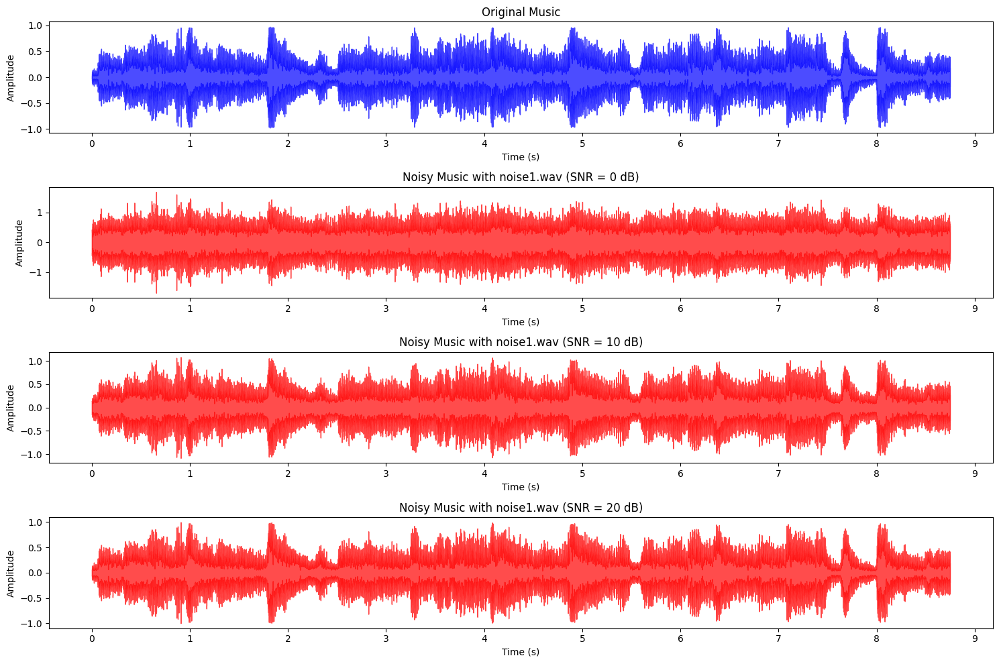

Original Music


Noisy Music with noise1.wav (SNR = 0 dB)


Noisy Music with noise1.wav (SNR = 10 dB)


Noisy Music with noise1.wav (SNR = 20 dB)


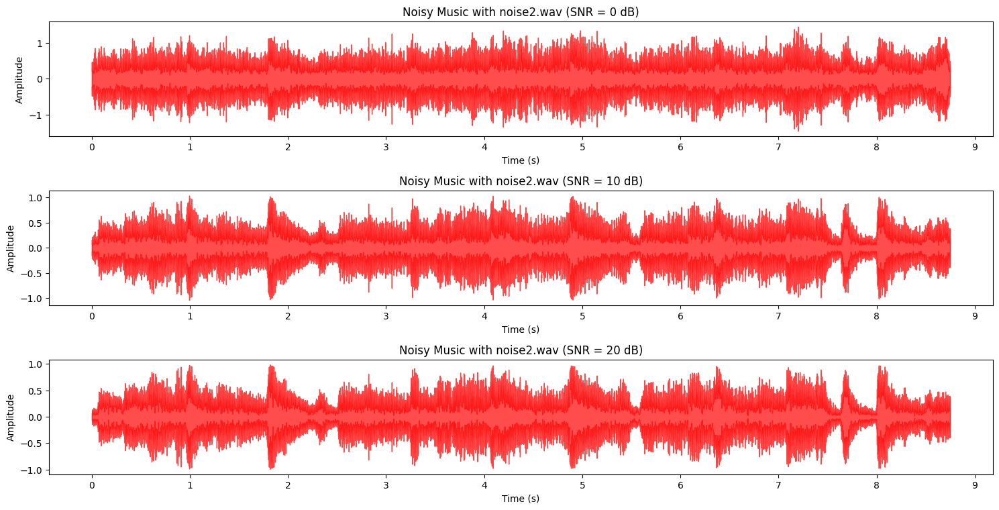

Noisy Music with noise2.wav (SNR = 0 dB)


Noisy Music with noise2.wav (SNR = 10 dB)


Noisy Music with noise2.wav (SNR = 20 dB)


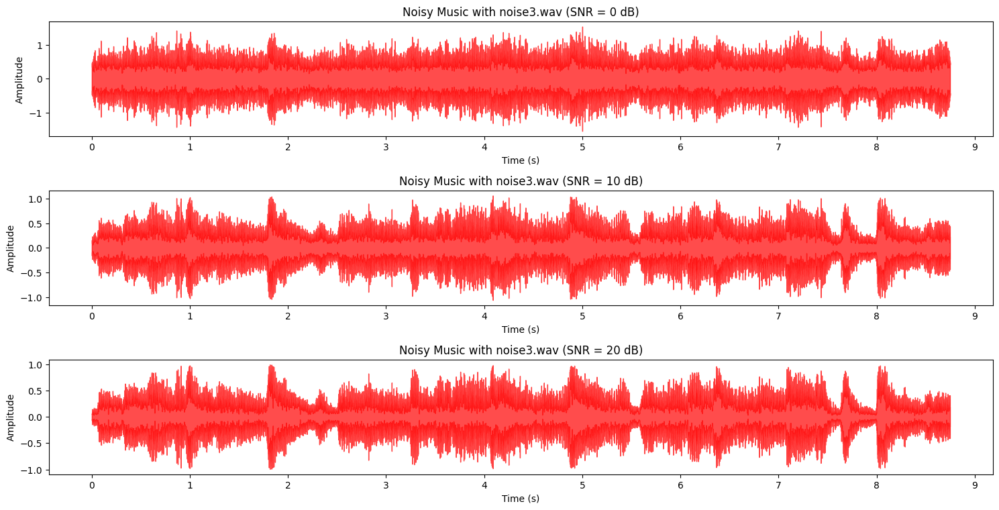

Noisy Music with noise3.wav (SNR = 0 dB)


Noisy Music with noise3.wav (SNR = 10 dB)


Noisy Music with noise3.wav (SNR = 20 dB)


In [4]:
noisy_signals_librosa = defaultdict(dict)

for index, nos in enumerate(NOISES):
    noise_data, _ = librosa.load(nos, sr=music_rate)
    
    for snr in SNR_VALUES:
        noisy_signals_librosa[index][snr] = add_noise(music_data, noise_data, snr)

    # Plot noisy music
    plt.figure(figsize=(15, 10))
    if index == 0:
        plt.subplot(4, 1, 1)
        librosa.display.waveshow(music_data, sr=music_rate, color='blue', alpha=0.7)
        plt.title("Original Music")
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")

    for i, snr in enumerate(SNR_VALUES, 2):
        plt.subplot(4, 1, i)
        librosa.display.waveshow(noisy_signals_librosa[index][snr], sr=music_rate, color='red', alpha=0.7)
        plt.title(f"Noisy Music with {nos} (SNR = {snr} dB)")
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")

    plt.tight_layout()
    plt.show()

    # Play the audio
    audio_players = {}
    if index == 0:
        audio_players["Original Music"] = Audio(music_data, rate=music_rate)

    for snr in SNR_VALUES:
        audio_players[f"Noisy Music with {nos} (SNR = {snr} dB)"] = Audio(noisy_signals_librosa[index][snr], rate=music_rate)

    for name, player in audio_players.items():
        print(name)
        display(player)


By hearing the audio we can notice the noises added to the music with respect to different SNR levels

# Estimation of the Power Spectrum of the noises with Welch's method

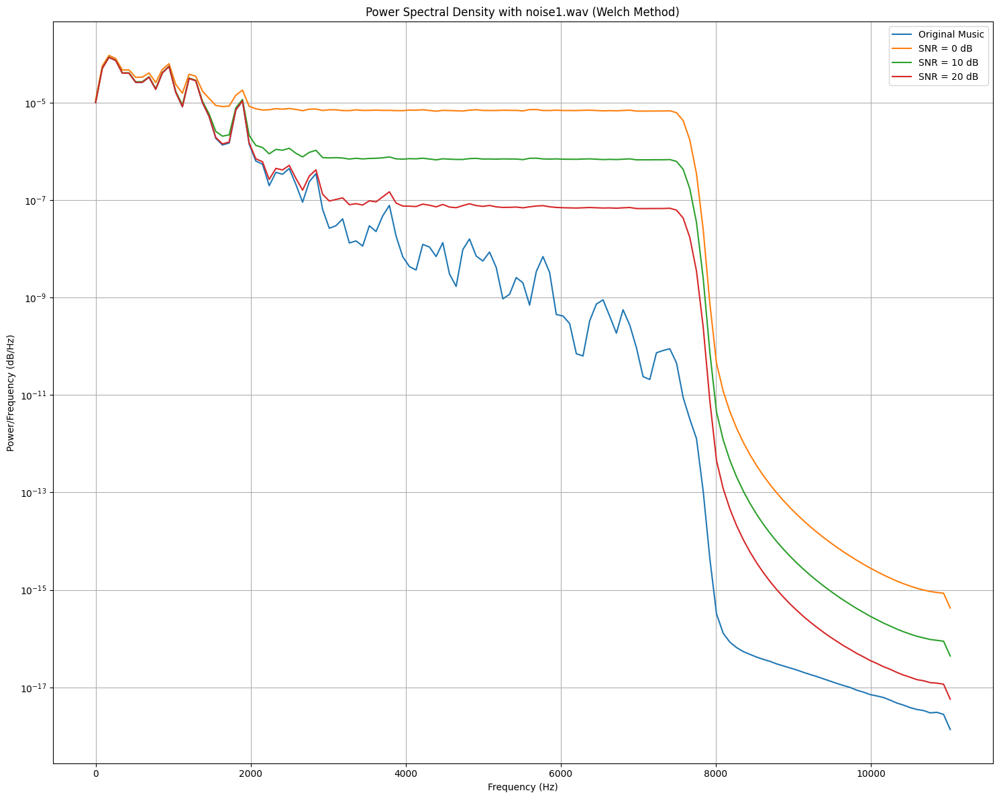

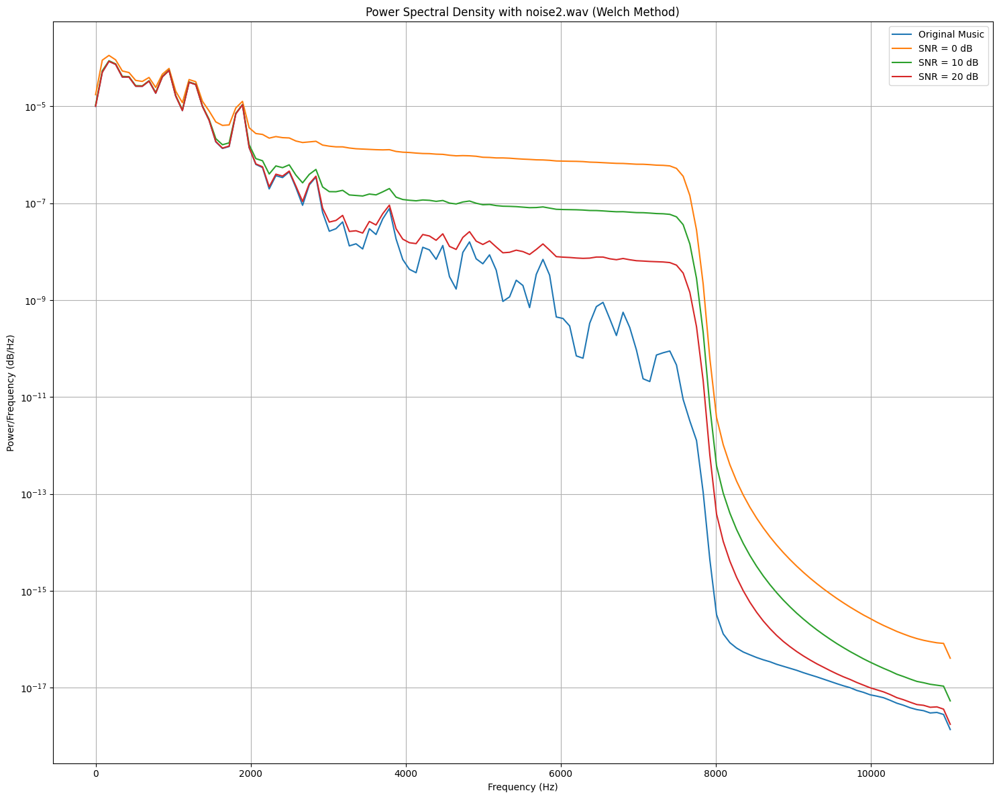

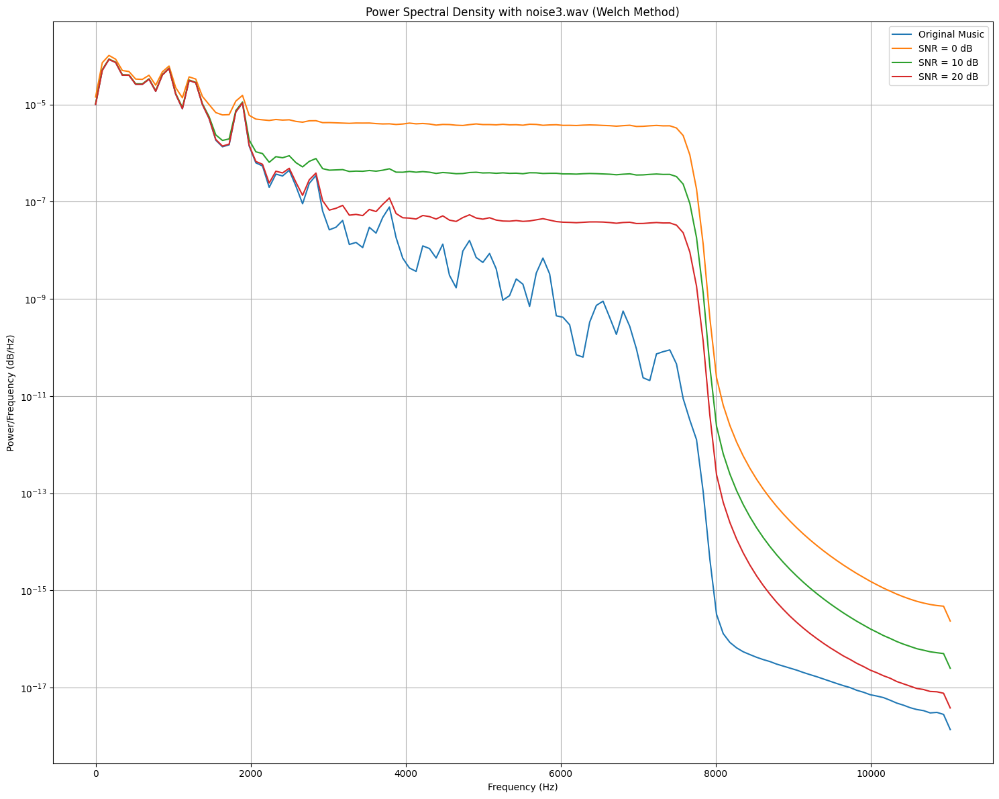

In [5]:
# Plot Power Spectral Density 
for index, nos in enumerate(NOISES):
    plt.figure(figsize=(15, 12))
    frequencies, psd_original = welch(music_data, fs=music_rate)
    plt.semilogy(frequencies, psd_original, label="Original Music")

    for snr in SNR_VALUES:
        frequencies, psd_noisy = welch(noisy_signals_librosa[index][snr], fs=music_rate)
        plt.semilogy(frequencies, psd_noisy, label=f"SNR = {snr} dB")

    plt.title(f"Power Spectral Density with {nos} (Welch Method)")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power/Frequency (dB/Hz)")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

---

# Denoising with Spectral Substraction

In this implementation we will using Scipy's `signal.stft` implementation which uses a Hann window by default, simplifying the computation of  as it will give us a tight Gabor Frame ideal for computing the inverse STFT

### Spectral substraction implementation

From the lectures we get the following formula for estimating the STFT of the denoised signal:

$$X(\tau, v) = Y(\tau, v) \max \left\{1 - \lambda^2\frac{|S_n(v)|^2}{|Y(\tau, v)|^2}, 0 \right\}$$


In [6]:
def spectral_substraction(noisy_signal,noise, lambd, window_len):
    """Spectral substraction algorithm"""
    
    # take the STFT of the noisy music
    _, _, Y = stft(noisy_signal, music_rate, nperseg = window_len)
    
    # calculate the power density spectrum of the noise
    _, Sn = welch(noise, fs=music_rate, nperseg = window_len)
    
    # calculate the spectral subtraction matrix 
    x = (1-(lambd**2)*(Sn**2)/abs(Y.T)**2)
    
    # Applying the max between x and 0
    x[x<0] = 0
    
    # Apply the spectral subtraction matrix to the matrix of the STFT of Y
    X = Y.T*x

    # inverse stft of X to get the denoised music
    # Note: Scipy uses a Hann window by default which allows for an easy inversion as the frame is a parseval frame.
    _, denoised_signal = istft(X.T, music_rate)
    return denoised_signal
    

### Denoising with Spectral Substracion

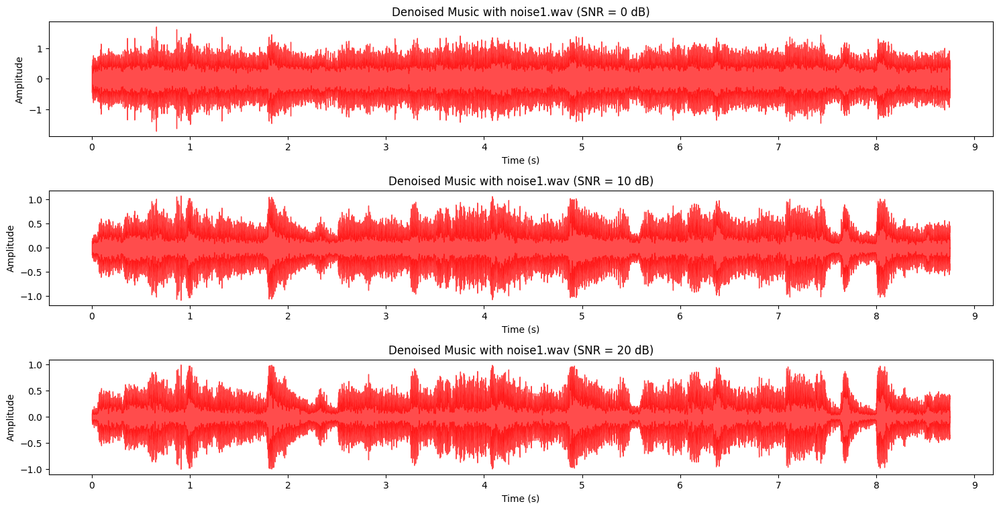

Denoised Music with noise1.wav (SNR = 0 dB)


Denoised Music with noise1.wav (SNR = 10 dB)


Denoised Music with noise1.wav (SNR = 20 dB)


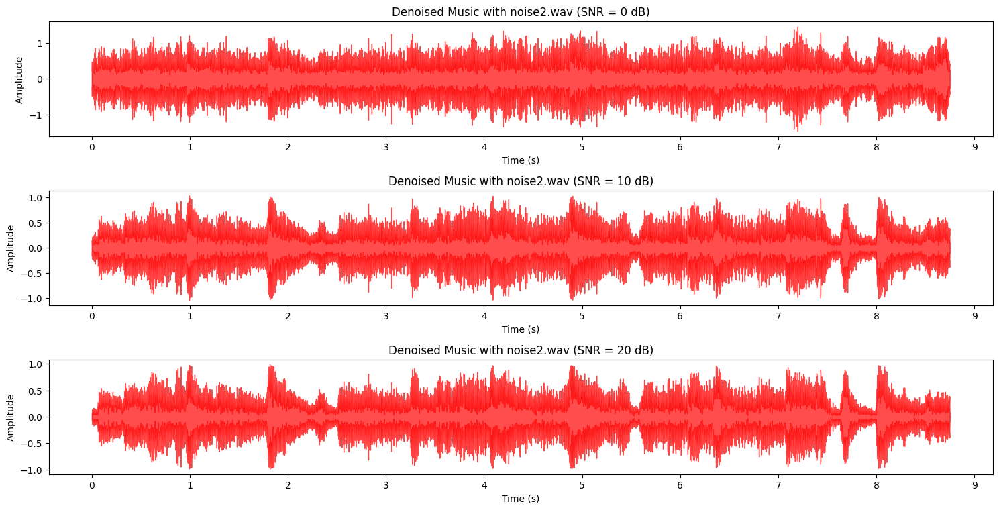

Denoised Music with noise2.wav (SNR = 0 dB)


Denoised Music with noise2.wav (SNR = 10 dB)


Denoised Music with noise2.wav (SNR = 20 dB)


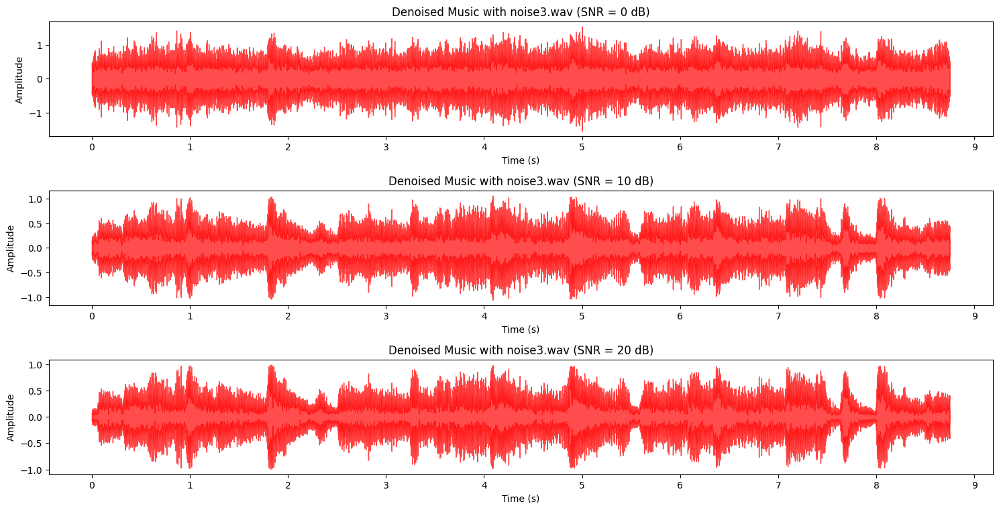

Denoised Music with noise3.wav (SNR = 0 dB)


Denoised Music with noise3.wav (SNR = 10 dB)


Denoised Music with noise3.wav (SNR = 20 dB)


In [7]:
denoised_signals_librosa = defaultdict(dict)  
window_size = 512
lambd = 0

for index, nos in enumerate(NOISES):
    noise_data, _ = librosa.load(nos, sr=music_rate)

    for snr in SNR_VALUES:
        denoised_signals_librosa[index][snr] = spectral_substraction(noisy_signals_librosa[index][snr], noise_data, lambd, window_size)
    
    # Plot noisy music
    plt.figure(figsize=(15, 10))
    for i, snr in enumerate(SNR_VALUES, 2):
        plt.subplot(4, 1, i)
        librosa.display.waveshow(denoised_signals_librosa[index][snr], sr=music_rate, color='red', alpha=0.7)
        plt.title(f"Denoised Music with {nos} (SNR = {snr} dB)")
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")

    plt.tight_layout()
    plt.show()

    # Play the audio
    audio_players = {}

    for snr in SNR_VALUES:
        audio_players[f"Denoised Music with {nos} (SNR = {snr} dB)"] = Audio(denoised_signals_librosa[index][snr], rate=music_rate)

    for name, player in audio_players.items():
        print(name)
        display(player)

### Parameter discussion : $ \lambda $

We remark in the previous audio we set the $\lambda=0$ and the noises are still there. Now, we will now plot the SNR value for each denoised file with a $ \lambda $ parameter varying from 0 to 5000.

This range was chosen so we could visually identify the peak SNR for each denoised file.

First we implement the SNR computation between the clean signal and the error which is the difference between the clean singal and the denoised signal.

In [8]:
def snr(clean , denoised):
    signal_power = np.mean(clean**2)
    error_power = np.mean((clean-denoised)**2)
    snr = 10 * np.log10(signal_power / error_power)
    return snr

We load all the noises to a dictionnary to facilitate computation.

In [9]:
noise = {}
for index, nos in enumerate(NOISES):
    noise_data, _ = librosa.load(nos, sr=music_rate)
    noise[index]= noise_data

We denoise each of the 9 noisy music signals using lambda values between 0 and 5000 (We tested every 10 values, hence 500 lambda values).

Then we compute the SNR of each of the (500 x 9 = 4500) denoised signals. We store this in the results dictionary.

In [10]:
lambdas = np.linspace(0, 5000, num=500)
results = {}

for index in [0, 1, 2]:
    for snr_index in [0, 10, 20]:
        snr_list = []
        for lambda_value in lambdas:
            
            denoised_signal = spectral_substraction(noisy_signals_librosa[index][snr_index], noise[index], lambda_value, window_size)
            
            snr_value = snr(music_data, denoised_signal[0:(music_data.shape[0])])
            
            snr_list.append(snr_value)
            
        results[(index, snr_index)] = snr_list

This is plot of the SNR variation with respect to the lambda parameter for each of the denoised signals of the 9 original noisy music signals.

Peak values are prominently displayed in dB.

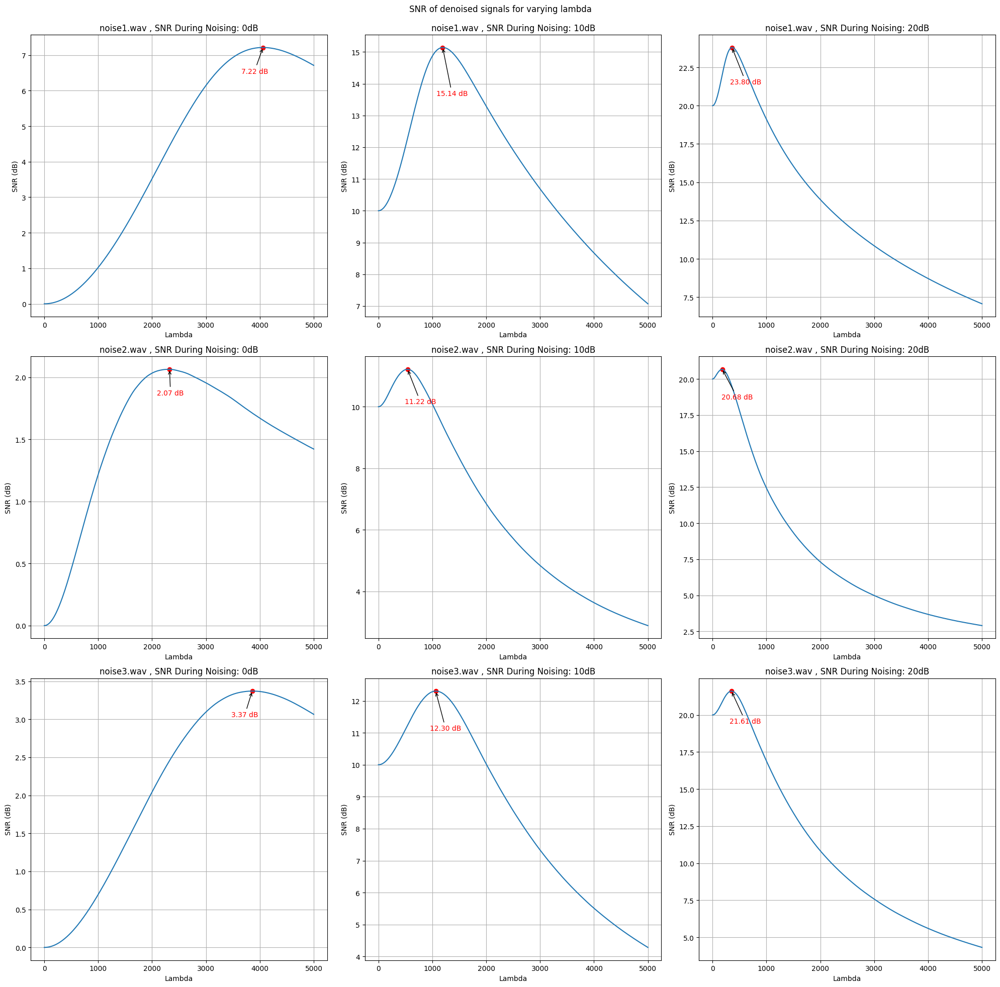

In [11]:
fig, axs = plt.subplots(3, 3, figsize=(20, 20))
fig.suptitle("SNR of denoised signals for varying lambda")
peak_snr_list = defaultdict(dict)  

position = {
    (0, 0): (0, 0), (0, 10): (0, 1), (0, 20): (0, 2),
    (1, 0): (1, 0), (1, 10): (1, 1), (1, 20): (1, 2),
    (2, 0): (2, 0), (2, 10): (2, 1), (2, 20): (2, 2)
}

for (index, snr_index), snr_list in results.items():
    row, col = position[(index, snr_index)]
    ax = axs[row, col]

    ax.plot(lambdas, snr_list)

    # Find the peak SNR and corresponding lambda
    peak_snr = max(snr_list)
    peak_lambda = lambdas[snr_list.index(peak_snr)]

    peak_snr_list[index][snr_index] = peak_lambda

    # Annotate the peak SNR value
    ax.annotate(f'{peak_snr:.2f} dB', 
                xy=(peak_lambda, peak_snr), 
                xytext=(peak_lambda*.9, peak_snr*.9),  # Adjust this for better placement
                arrowprops=dict(facecolor='red', arrowstyle='->'),
                color='red')

    # Highlight the peak position using a red dot
    ax.scatter(peak_lambda, peak_snr, color='red')

    ax.set_title(f"noise{index+1}.wav , SNR During Noising: {snr_index}dB")
    ax.set_xlabel("Lambda")
    ax.set_ylabel("SNR (dB)")
    ax.grid(True)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()


From the plots a relation becomes quite clear: 

For each noise file, the smaller the SNR level, the bigger the lambda parameter is required to get the best denoising.

Therefore there more noise there is, the bigger the lambda parameter needs to be. Now, let's see how we denoise using the right lambda value.

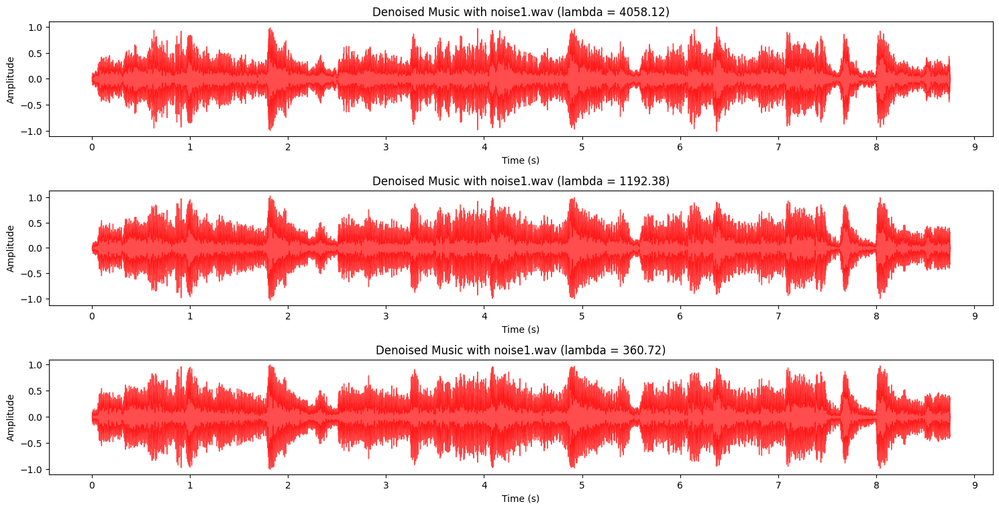

Denoised Music with noise1.wav (lambda = 4058.12)


Denoised Music with noise1.wav (lambda = 1192.38)


Denoised Music with noise1.wav (lambda = 360.72)


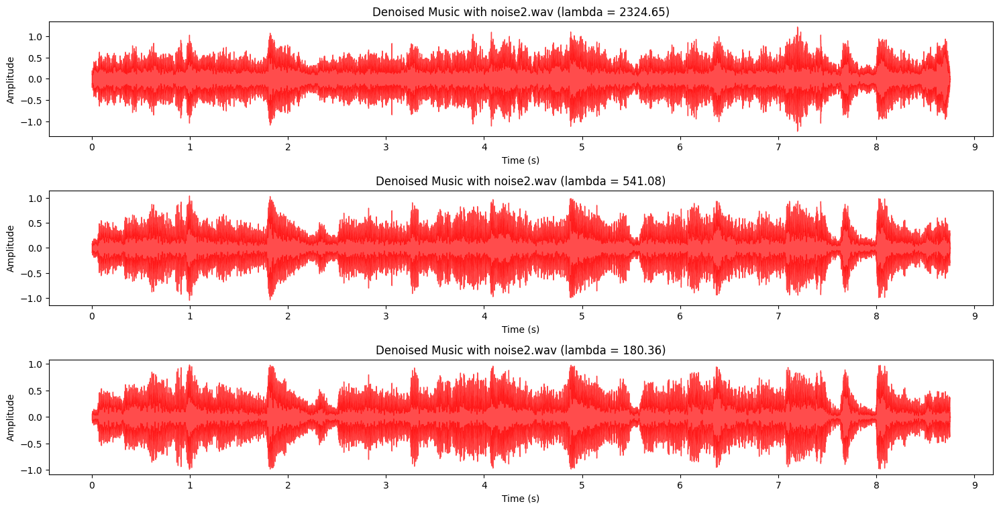

Denoised Music with noise2.wav (lambda = 2324.65)


Denoised Music with noise2.wav (lambda = 541.08)


Denoised Music with noise2.wav (lambda = 180.36)


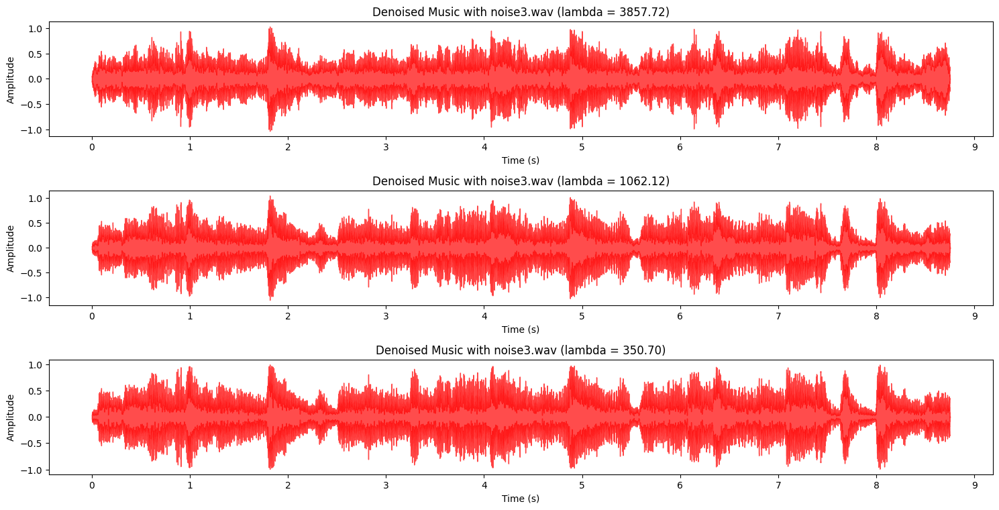

Denoised Music with noise3.wav (lambda = 3857.72)


Denoised Music with noise3.wav (lambda = 1062.12)


Denoised Music with noise3.wav (lambda = 350.70)


In [12]:
denoised_signals_librosa = defaultdict(dict)  
window_size = 512

for index, nos in enumerate(NOISES):
    noise_data, _ = librosa.load(nos, sr=music_rate)

    for snr in SNR_VALUES:
        denoised_signals_librosa[index][snr] = spectral_substraction(noisy_signals_librosa[index][snr], noise_data, peak_snr_list[index][snr], window_size)

    # Plot noisy music
    plt.figure(figsize=(15, 10))
    for i, snr in enumerate(SNR_VALUES, 2):
        plt.subplot(4, 1, i)
        librosa.display.waveshow(denoised_signals_librosa[index][snr], sr=music_rate, color='red', alpha=0.7)
        plt.title(f"Denoised Music with {nos} (lambda = {peak_snr_list[index][snr]:.2f})")
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")

    plt.tight_layout()
    plt.show()

    # Play the audio
    audio_players = {}

    for snr in SNR_VALUES:
        audio_players[f"Denoised Music with {nos} (lambda = {peak_snr_list[index][snr]:.2f})"] = Audio(denoised_signals_librosa[index][snr], rate=music_rate)

    for name, player in audio_players.items():
        print(name)
        display(player)

We can hear again the audio and notice the differences